In [1]:
import gc
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import os
import xgboost as xgb
import lightgbm as lgb
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split

In [2]:
####################训练集#######################
DATA_PATH = "datasets"
csv_path = os.path.join(DATA_PATH, "atec_anti_fraud_train.csv")
data = pd.read_csv(csv_path)

In [3]:
####################测试集#######################
csv_path = os.path.join(DATA_PATH, "atec_anti_fraud_test_b.csv")
data_test = pd.read_csv(csv_path)

In [7]:
data_201709 = data[data['date'] <= 20170930]
data_201710 = data[(data['date'] > 20170930) & (data['date'] <= 20171031)]
data_201711 = data[data['date'] > 20171031]
data_201801 = data_test[data_test['date'] <= 201810131]
data_201802 = data_test[data_test['date'] > 201810131]

In [5]:
cols = [c for c in data.columns if 'f' in c]
print(cols)

['f1', 'f2', 'f3', 'f4', 'f5', 'f6', 'f7', 'f8', 'f9', 'f10', 'f11', 'f12', 'f13', 'f14', 'f15', 'f16', 'f17', 'f18', 'f19', 'f20', 'f21', 'f22', 'f23', 'f24', 'f25', 'f26', 'f27', 'f28', 'f29', 'f30', 'f31', 'f32', 'f33', 'f34', 'f35', 'f36', 'f37', 'f38', 'f39', 'f40', 'f41', 'f42', 'f43', 'f44', 'f45', 'f46', 'f47', 'f48', 'f49', 'f50', 'f51', 'f52', 'f53', 'f54', 'f55', 'f56', 'f57', 'f58', 'f59', 'f60', 'f61', 'f62', 'f63', 'f64', 'f65', 'f66', 'f67', 'f68', 'f69', 'f70', 'f71', 'f72', 'f73', 'f74', 'f75', 'f76', 'f77', 'f78', 'f79', 'f80', 'f81', 'f82', 'f83', 'f84', 'f85', 'f86', 'f87', 'f88', 'f89', 'f90', 'f91', 'f92', 'f93', 'f94', 'f95', 'f96', 'f97', 'f98', 'f99', 'f100', 'f101', 'f102', 'f103', 'f104', 'f105', 'f106', 'f107', 'f108', 'f109', 'f110', 'f111', 'f112', 'f113', 'f114', 'f115', 'f116', 'f117', 'f118', 'f119', 'f120', 'f121', 'f122', 'f123', 'f124', 'f125', 'f126', 'f127', 'f128', 'f129', 'f130', 'f131', 'f132', 'f133', 'f134', 'f135', 'f136', 'f137', 'f138', 'f1

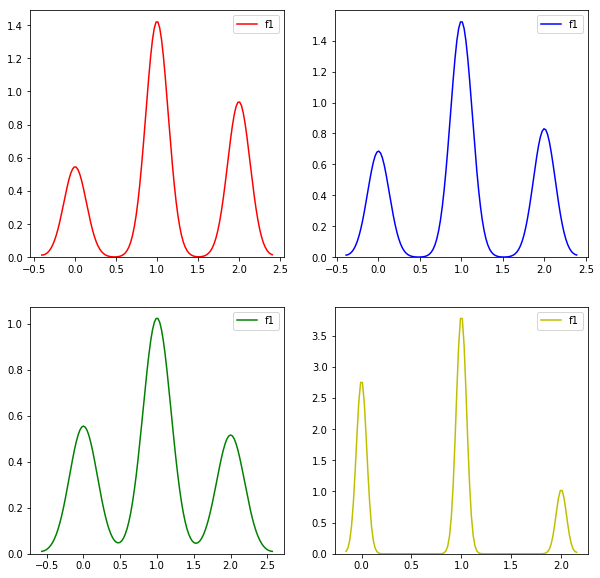

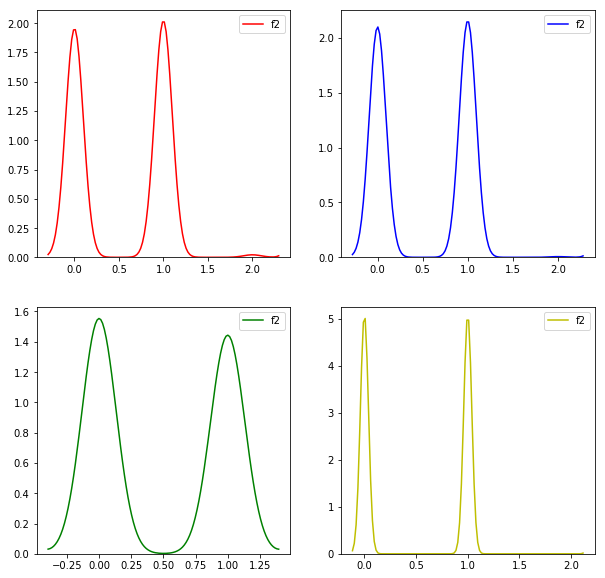

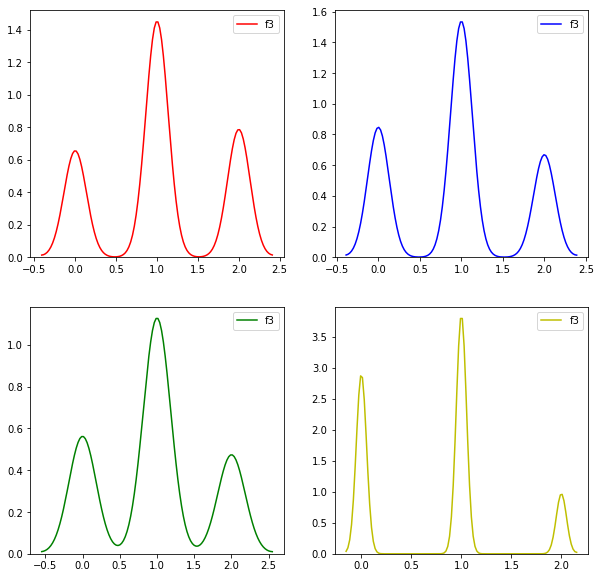

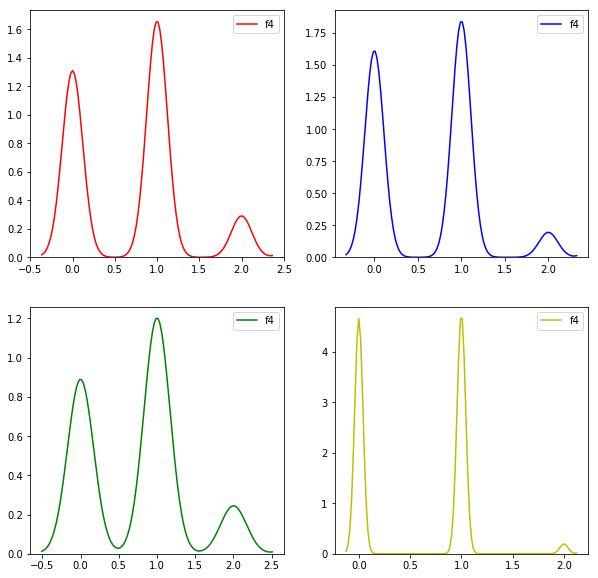

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\nonparametric\kde.py:454: RuntimeWarning: invalid value encountered in greater
  X = X[np.logical_and(X>clip[0], X<clip[1])] # won't work for two columns.
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\nonparametric\kde.py:454: RuntimeWarning: invalid value encountered in less
  X = X[np.logical_and(X>clip[0], X<clip[1])] # won't work for two columns.


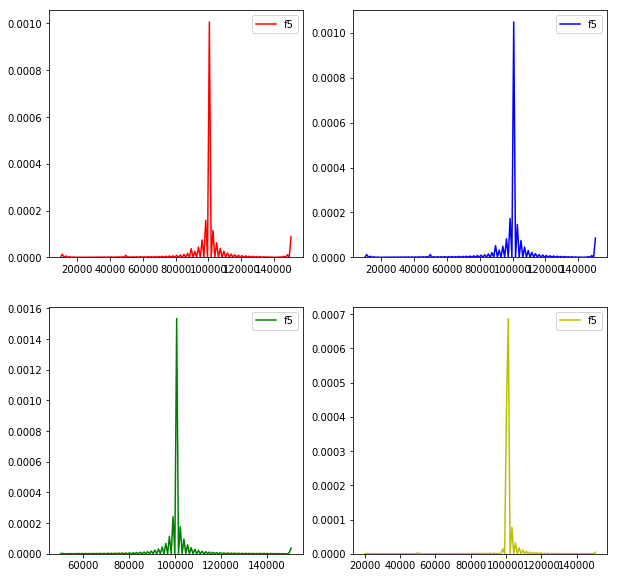

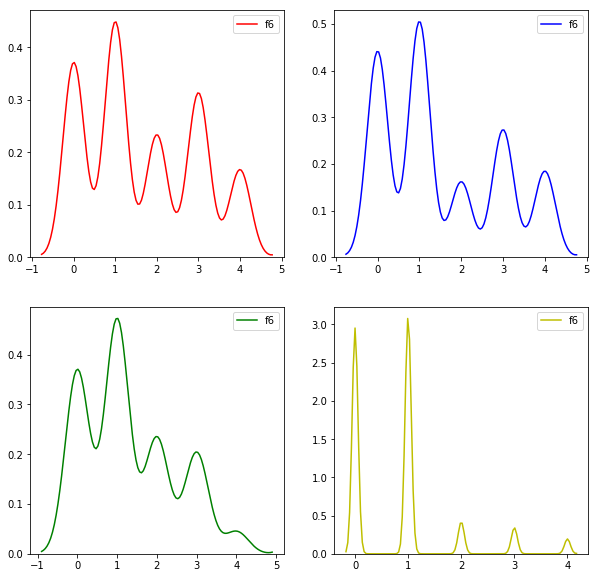

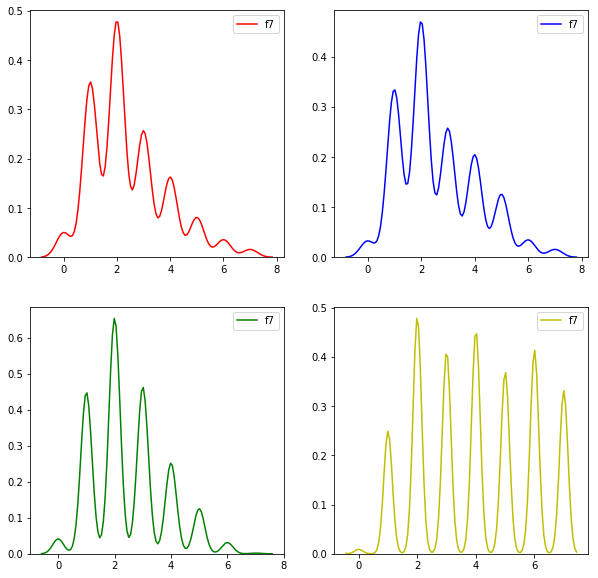

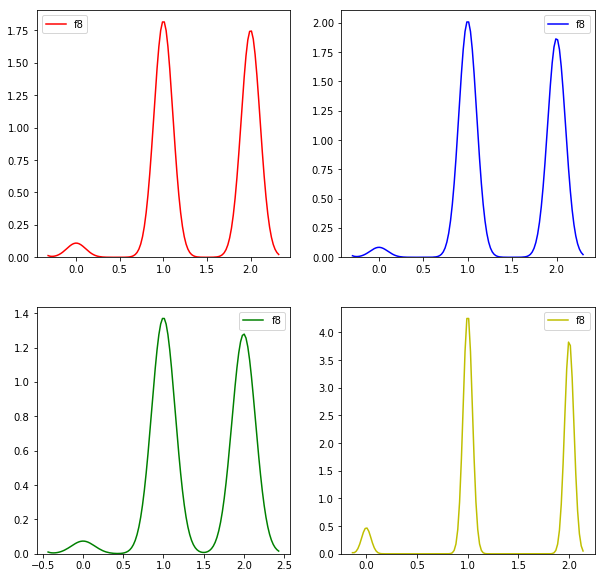

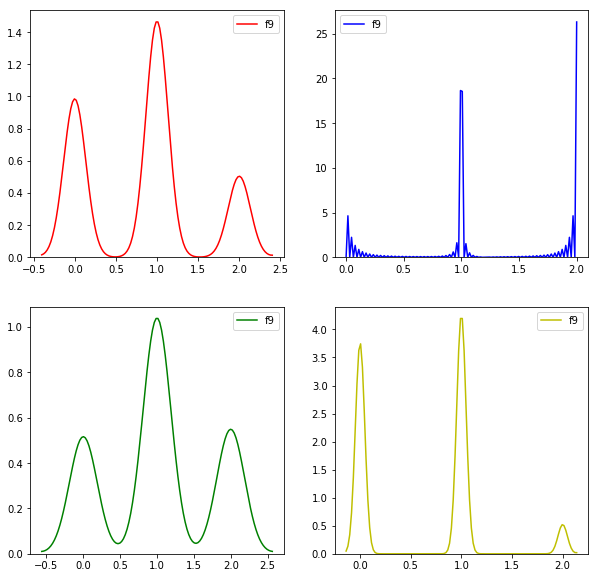

...

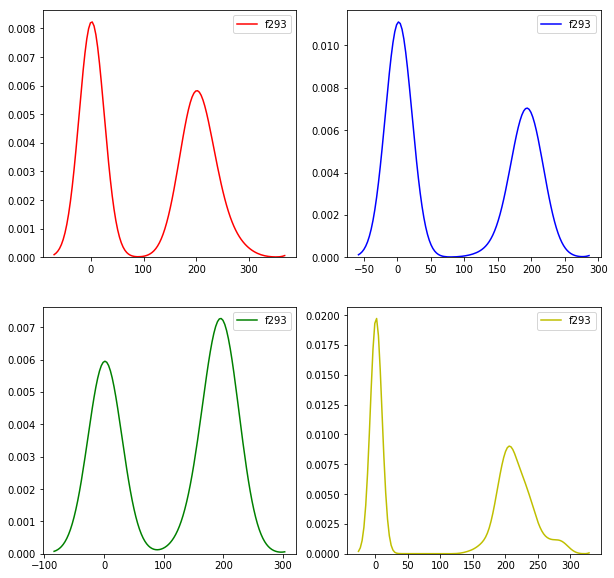

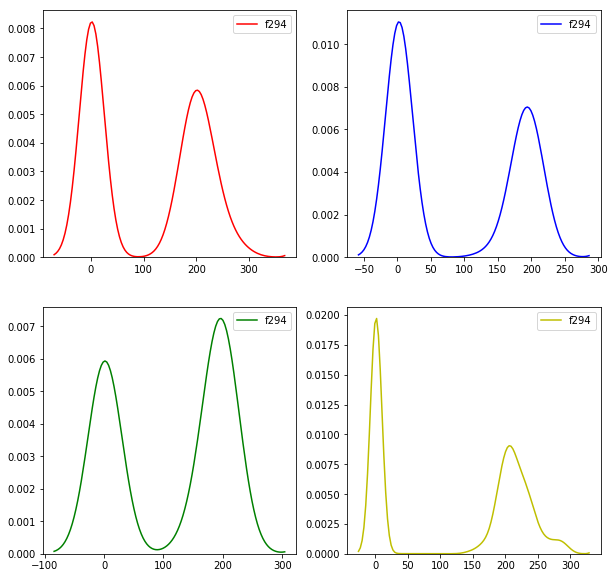

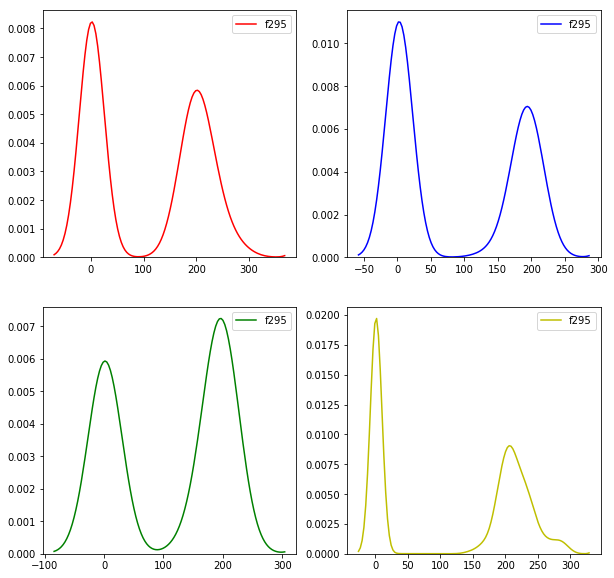

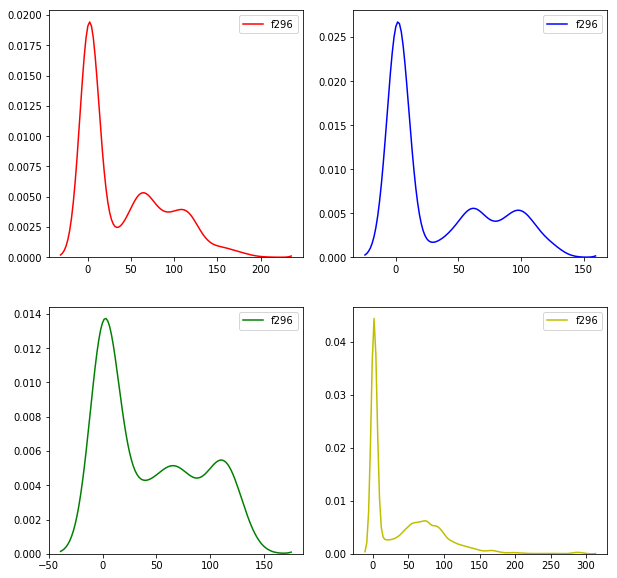

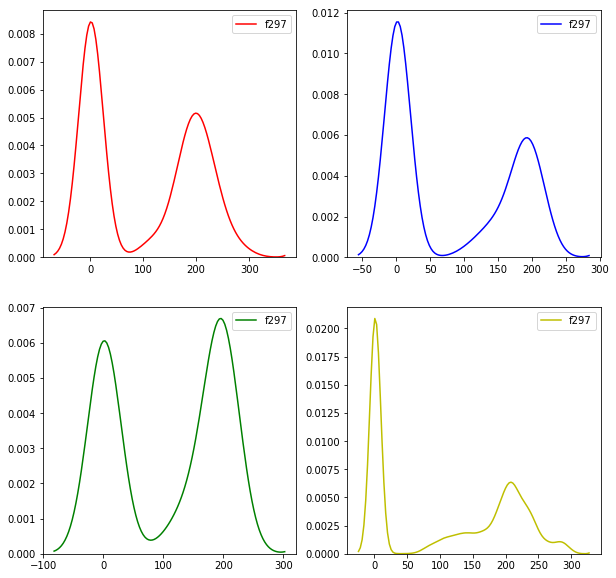

In [8]:
for col in cols:
    fig,ax =plt.subplots(2,2,figsize=(10,10))
    sns.kdeplot(data_201709[col][data_201709['label']==1],color='r',ax=ax[0][0])
    sns.kdeplot(data_201710[col][data_201710['label']==1],color='b',ax=ax[0][1])
    sns.kdeplot(data_201711[col][data_201711['label']==1],color='g',ax=ax[1][0])
    sns.kdeplot(data_test[col],color='y',ax=ax[1][1])
    plt.show()

In [18]:
data.shape

(994731, 300)

In [43]:
y = []
for i in list(data.columns)[3:]:
    y.append((data.shape[0] - data[i].count()) / data.shape[0] * 100)
print(y)

[0.0, 0.0, 0.0, 0.0, 20.088345492399455, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 20.85468332644705, 20.85468332644705, 20.85468332644705, 20.85468332644705, 20.868455894106045, 20.868455894106045, 20.868455894106045, 20.868455894106045, 21.215383857545405, 21.215383857545405, 21.215383857545405, 21.215383857545405, 34.36979444694093, 34.36979444694093, 34.36979444694093, 34.36979444694093, 93.06847780957867, 93.06847780957867, 93.06847780957867, 93.06847780957867, 93.06847780957867, 93.06847780957867, 93.06847780957867, 93.06847780957867, 93.06847780957867, 93.06847780957867, 93.06847780957867, 93.06847780957867, 34.34707473678814, 34.34707473678814, 34.34707473678814, 34.34707473678814, 20.85468332644705, 20.85468332644705, 34.34707473678814, 34.34707473678814, 34.34707473678814, 34.34707473678814, 34.34707473678814, 34.34707473678814, 34.34707473678814, 34.34707473678814, 34.34707473678814, 34.34707473678814, 27.194789345059117, 27.194789345059117, 27.19

In [17]:
x = list(data.columns)[3:]
x

['f1',
 'f2',
 'f3',
 'f4',
 'f5',
 'f6',
 'f7',
 'f8',
 'f9',
 'f10',
 'f11',
 'f12',
 'f13',
 'f14',
 'f15',
 'f16',
 'f17',
 'f18',
 'f19',
 'f20',
 'f21',
 'f22',
 'f23',
 'f24',
 'f25',
 'f26',
 'f27',
 'f28',
 'f29',
 'f30',
 'f31',
 'f32',
 'f33',
 'f34',
 'f35',
 'f36',
 'f37',
 'f38',
 'f39',
 'f40',
 'f41',
 'f42',
 'f43',
 'f44',
 'f45',
 'f46',
 'f47',
 'f48',
 'f49',
 'f50',
 'f51',
 'f52',
 'f53',
 'f54',
 'f55',
 'f56',
 'f57',
 'f58',
 'f59',
 'f60',
 'f61',
 'f62',
 'f63',
 'f64',
 'f65',
 'f66',
 'f67',
 'f68',
 'f69',
 'f70',
 'f71',
 'f72',
 'f73',
 'f74',
 'f75',
 'f76',
 'f77',
 'f78',
 'f79',
 'f80',
 'f81',
 'f82',
 'f83',
 'f84',
 'f85',
 'f86',
 'f87',
 'f88',
 'f89',
 'f90',
 'f91',
 'f92',
 'f93',
 'f94',
 'f95',
 'f96',
 'f97',
 'f98',
 'f99',
 'f100',
 'f101',
 'f102',
 'f103',
 'f104',
 'f105',
 'f106',
 'f107',
 'f108',
 'f109',
 'f110',
 'f111',
 'f112',
 'f113',
 'f114',
 'f115',
 'f116',
 'f117',
 'f118',
 'f119',
 'f120',
 'f121',
 'f122',
 'f123',
 

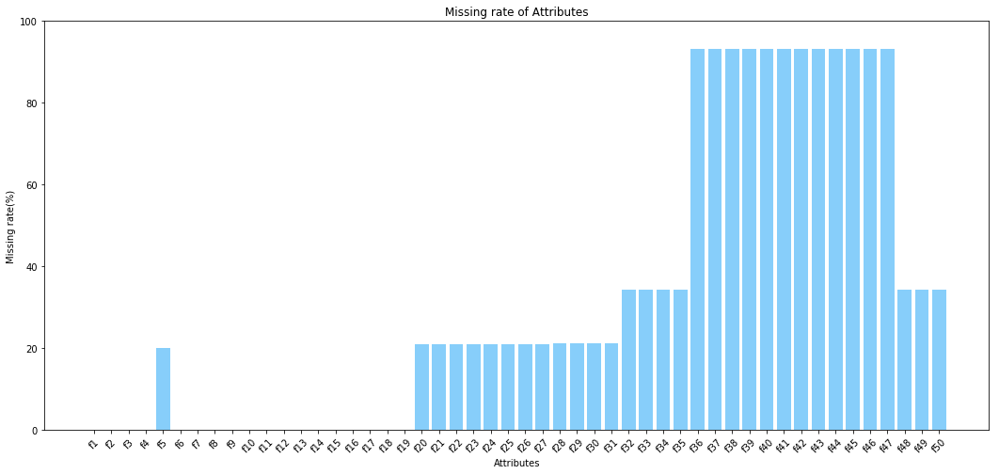

In [64]:
index = np.arange(1,len(x[:50])+1)
bar_width = 0.8
opacity = 1
plt.figure(figsize=(18,8))
plt.bar(index, y[:50], bar_width,alpha=opacity,color='#87CEFA')
plt.xlabel('Attributes')
plt.ylabel('Missing rate(%)')  
plt.title('Missing rate of Attributes')  
plt.xticks(index,tuple(x[:50]),rotation=45)  
plt.ylim(0,100)  
plt.show() 

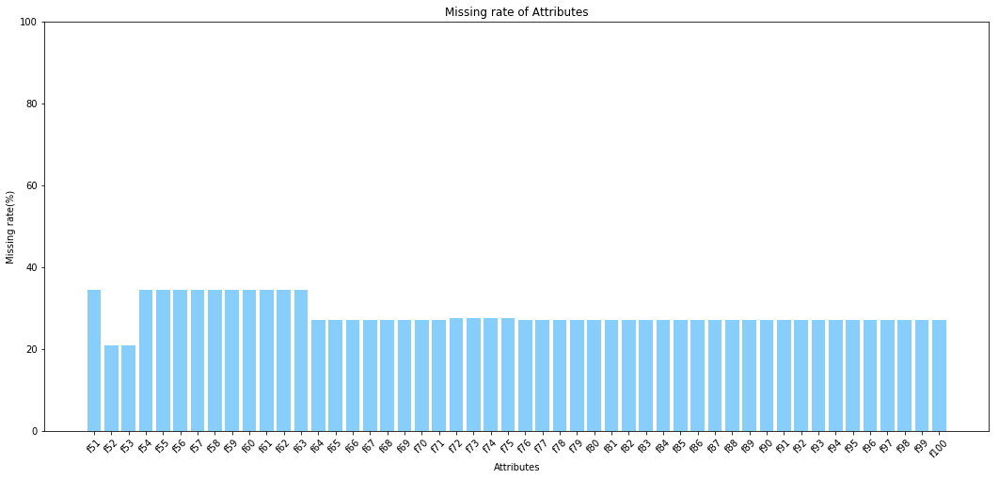

In [65]:
index = np.arange(1,len(x[50:100])+1)
bar_width = 0.8
opacity = 1
plt.figure(figsize=(18,8))
plt.bar(index, y[50:100], bar_width,alpha=opacity,color='#87CEFA')
plt.xlabel('Attributes')
plt.ylabel('Missing rate(%)')  
plt.title('Missing rate of Attributes')  
plt.xticks(index,tuple(x[50:100]),rotation=45)  
plt.ylim(0,100)  
plt.show() 

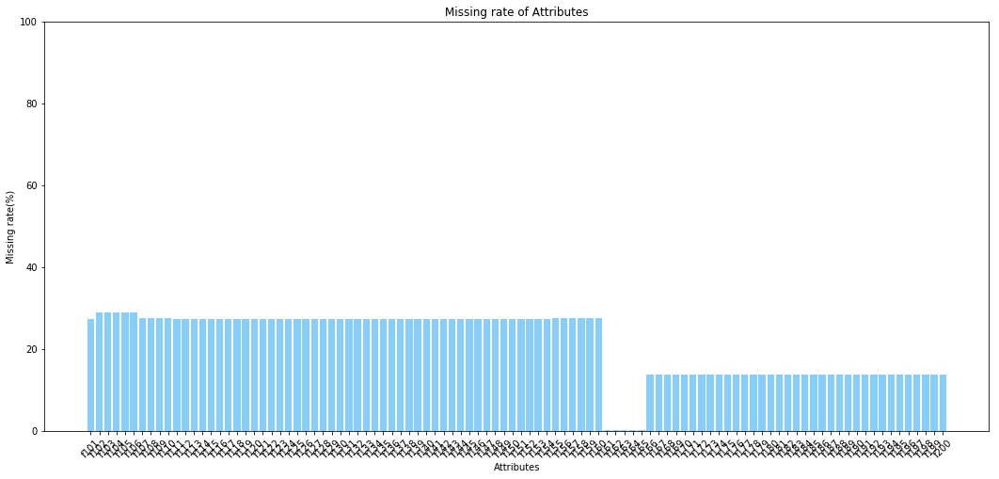

In [66]:
index = np.arange(1,len(x[100:200])+1)
bar_width = 0.8
opacity = 1
plt.figure(figsize=(18,8))
plt.bar(index, y[100:200], bar_width,alpha=opacity,color='#87CEFA')
plt.xlabel('Attributes')
plt.ylabel('Missing rate(%)')  
plt.title('Missing rate of Attributes')  
plt.xticks(index,tuple(x[100:200]),rotation=45)  
plt.ylim(0,100)  
plt.show() 

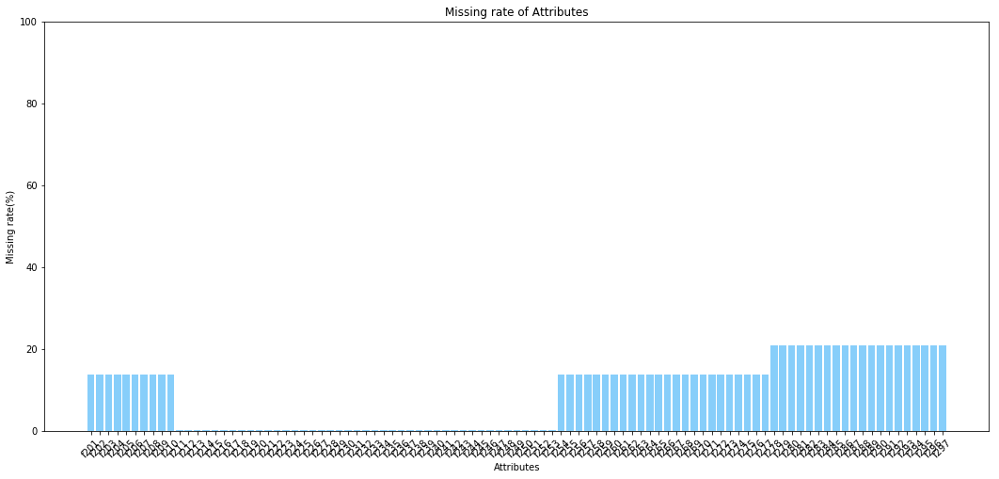

In [67]:
index = np.arange(1,len(x[200:])+1)
bar_width = 0.8
opacity = 1
plt.figure(figsize=(18,8))
plt.bar(index, y[200:], bar_width,alpha=opacity,color='#87CEFA')
plt.xlabel('Attributes')
plt.ylabel('Missing rate(%)')  
plt.title('Missing rate of Attributes')  
plt.xticks(index,tuple(x[200:]),rotation=45)  
plt.ylim(0,100)  
plt.show() 

In [68]:
data_test.columns

Index(['id', 'date', 'f1', 'f2', 'f3', 'f4', 'f5', 'f6', 'f7', 'f8',
       ...
       'f288', 'f289', 'f290', 'f291', 'f292', 'f293', 'f294', 'f295', 'f296',
       'f297'],
      dtype='object', length=299)

In [72]:
y_test = []
for i in list(data_test.columns)[2:]:
    y_test.append((data_test.shape[0] - data_test[i].count()) / data_test.shape[0] * 100)
print(y)

[0.0, 0.0, 0.0, 0.0, 20.088345492399455, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 20.85468332644705, 20.85468332644705, 20.85468332644705, 20.85468332644705, 20.868455894106045, 20.868455894106045, 20.868455894106045, 20.868455894106045, 21.215383857545405, 21.215383857545405, 21.215383857545405, 21.215383857545405, 34.36979444694093, 34.36979444694093, 34.36979444694093, 34.36979444694093, 93.06847780957867, 93.06847780957867, 93.06847780957867, 93.06847780957867, 93.06847780957867, 93.06847780957867, 93.06847780957867, 93.06847780957867, 93.06847780957867, 93.06847780957867, 93.06847780957867, 93.06847780957867, 34.34707473678814, 34.34707473678814, 34.34707473678814, 34.34707473678814, 20.85468332644705, 20.85468332644705, 34.34707473678814, 34.34707473678814, 34.34707473678814, 34.34707473678814, 34.34707473678814, 34.34707473678814, 34.34707473678814, 34.34707473678814, 34.34707473678814, 34.34707473678814, 27.194789345059117, 27.194789345059117, 27.19

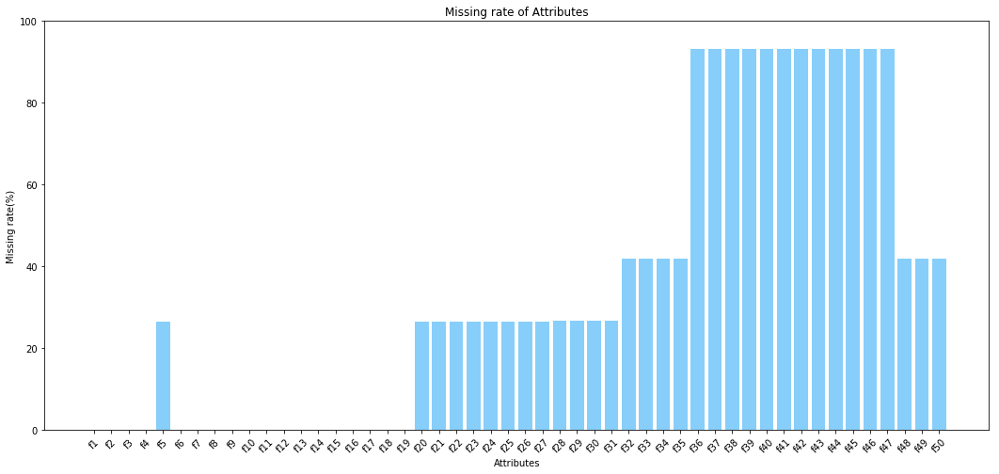

In [73]:
index = np.arange(1,len(x[:50])+1)
bar_width = 0.8
opacity = 1
plt.figure(figsize=(18,8))
plt.bar(index, y_test[:50], bar_width,alpha=opacity,color='#87CEFA')
plt.xlabel('Attributes')
plt.ylabel('Missing rate(%)')  
plt.title('Missing rate of Attributes')  
plt.xticks(index,tuple(x[:50]),rotation=45)  
plt.ylim(0,100)  
plt.show() 

In [79]:
x = list(data.columns[3:])
for i in range(len(y)):
    if y[i] > 80:
        print(x[i])

f36
f37
f38
f39
f40
f41
f42
f43
f44
f45
f46
f47


In [12]:
col_int = []
for col in cols:
    print(col, data[col].dtype)
    if data[col].dtype == "int64":
        col_int.append(col)

f1 int64
f2 int64
f3 int64
f4 int64
f5 float64
f6 int64
f7 int64
f8 int64
f9 int64
f10 int64
f11 int64
f12 int64
f13 int64
f14 int64
f15 int64
f16 int64
f17 int64
f18 int64
f19 int64
f20 float64
f21 float64
f22 float64
f23 float64
f24 float64
f25 float64
f26 float64
f27 float64
f28 float64
f29 float64
f30 float64
f31 float64
f32 float64
f33 float64
f34 float64
f35 float64
f36 float64
f37 float64
f38 float64
f39 float64
f40 float64
f41 float64
f42 float64
f43 float64
f44 float64
f45 float64
f46 float64
f47 float64
f48 float64
f49 float64
f50 float64
f51 float64
f52 float64
f53 float64
f54 float64
f55 float64
f56 float64
f57 float64
f58 float64
f59 float64
f60 float64
f61 float64
f62 float64
f63 float64
f64 float64
f65 float64
f66 float64
f67 float64
f68 float64
f69 float64
f70 float64
f71 float64
f72 float64
f73 float64
f74 float64
f75 float64
f76 float64
f77 float64
f78 float64
f79 float64
f80 float64
f81 float64
f82 float64
f83 float64
f84 float64
f85 float64
f86 float64
f87 float64
f

In [13]:
print(col_int)

['f1', 'f2', 'f3', 'f4', 'f6', 'f7', 'f8', 'f9', 'f10', 'f11', 'f12', 'f13', 'f14', 'f15', 'f16', 'f17', 'f18', 'f19']


In [69]:
####################训练集#######################
pd.set_option('display.max_columns',2000)
data

,id,label,date,f1,f2,f3,f4,f5,f6,f7,f8,f9,f10,f11,f12,f13,f14,f15,f16,f17,f18,f19,f20,f21,f22,f23,f24,f25,f26,f27,f28,f29,f30,f31,f32,f33,f34,f35,f36,f37,f38,f39,f40,f41,f42,f43,f44,f45,f46,f47,f48,f49,f50,f51,f52,f53,f54,f55,f56,f57,f58,f59,f60,f61,f62,f63,f64,f65,f66,f67,f68,f69,f70,f71,f72,f73,f74,f75,f76,f77,f78,f79,f80,f81,f82,f83,f84,f85,f86,f87,f88,f89,f90,f91,f92,f93,f94,f95,f96,f97,f98,f99,f100,f101,f102,f103,f104,f105,f106,f107,f108,f109,f110,f111,f112,f113,f114,f115,f116,f117,f118,f119,f120,f121,f122,f123,f124,f125,f126,f127,f128,f129,f130,f131,f132,f133,f134,f135,f136,f137,f138,f139,f140,f141,f142,f143,f144,f145,f146,f147,f148,f149,f150,f151,f152,f153,f154,f155,f156,f157,f158,f159,f160,f161,f162,f163,f164,f165,f166,f167,f168,f169,f170,f171,f172,f173,f174,f175,f176,f177,f178,f179,f180,f181,f182,f183,f184,f185,f186,f187,f188,f189,f190,f191,f192,f193,f194,f195,f196,f197,f198,f199,f200,f201,f202,f203,f204,f205,f206,f207,f208,f209,f210,f211,f212,f213,f214,f215,f216,f217,f218,f219,f220,f221,f222,f223,f224,f225,f226,f227,f228,f229,f230,f231,f232,f233,f234,f235,f236,f237,f238,f239,f240,f241,f242,f243,f244,f245,f246,f247,f248,f249,f250,f251,f252,f253,f254,f255,f256,f257,f258,f259,f260,f261,f262,f263,f264,f265,f266,f267,f268,f269,f270,f271,f272,f273,f274,f275,f276,f277,f278,f279,f280,f281,f282,f283,f284,f285,f286,f287,f288,f289,f290,f291,f292,f293,f294,f295,f296,f297,n_null
803535,6c2687bacd76c8f4b2dfb874d8e19c541b71c50d2172c6...,0,20170916,1,1,1,1,100805.0,1,1,1,1,1,1,0,2,2,2,1,2,0,0,13.0,12.0,47.0,48.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,NaN,NaN,NaN,NaN,2.0,2.0,2.0,1.0,2.0,1.0,1.0,2.0,2.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,2.0,1.0,1.0,1.0,2.0,1.0,1.0,2.0,1.0,2.0,78.0,32.0,302.0,299.0,301.0,301.0,301.0,301.0,1.0,1.0,1.0,0.0,2.0,3.0,2.0,3.0,15.0,18.0,750.0,13840.0,19341.0,1250.0,9920.0,2.0,2.0,2.0,2.0,1.0,2.0,3.0,3.0,3.0,3.0,3.0,4.0,8.0,12.0,11.0,4.0,8.0,13.0,17.0,18.0,2.0,1.0,1.0,1.0,202.0,202.0,198.0,199.0,200.0,199.0,201.0,201.0,202.0,198.0,200.0,199.0,32.0,32.0,27.0,27.0,26.0,26.0,31.0,78.0,41.0,41.0,42.0,63.0,31.0,31.0,27.0,27.0,26.0,27.0,31.0,240.0,240.0,132.0,134.0,133.0,134.0,240.0,202.0,202.0,198.0,199.0,200.0,301.0,1.0,1.0,2.0,2.0,1.0,1.0,1.0,2.0,2.0,1.0,2.0,2.0,1.0,1.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,1.0,1.0,2.0,1.0,1.0,1.0,1.0,1.0,2.0,2.0,1.0,2.0,1.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,1.0,2.0,1.0,1.0,1.0,2.0,1.0,2.0,1.0,1.0,1.0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,2.0,1.0,2.0,1.0,2.0,1.0,2.0,1.0,2.0,1.0,1.0,1.0,1.0,2.0,2.0,1.0,2.0,1.0,3.0,2.0,1.0,1.0,1.0,2.0,1.0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0,1.0,1.0,2.0,0.0,1.0,0.0,0.0,40.0,197.0,245.0,342.0,368.0,17.0,82.0,103.0,124.0,124.0,302.0,312.0,368.0,87.0,301.0,200.0,202.0,202.0,55.0,200.0,4
527127,04dc5ec2c34b5cfc41c8bbdb78b24b23f217e006025dfa...,0,20171105,0,0,0,0,100805.0,1,1,1,1,1,1,2,0,1,1,1,2,1,1,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,NaN,NaN,NaN,NaN,1.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0,1.0,2.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,2.0,2.0,2.0,2.0,1.0,1.0,3.0,1.0,17.0,1.0,2.0,2.0,2.0,4.0,6.0,17.0,6.0,17.0,1.0,3.0,5.0,9.0,21.0,56.0,11.0,50361.0,101649.0,22003.9,28255.9,1.0,1.0,2.0,1.0,2.0,1.0,2.0,2.0,2.0,3.0,3.0,4.0,7.0,14.0,28.0,8.0,13.0,21.0,51.0,106.0,2.0,3.0,7.0,19.0,1.0,2.0,1.0,2.0,1.0,2.0,1.0,2.0,1.0,2.0,2.0,1.0,2.0,2.0,1.0,1.0,2.0,2.0,2.0,1.0,1.0,1.0,2.0,1.0,2.0,1.0,1.0,1.0,1.0,1.0,2.0,1.0,1.0,2.0,1.0,1.0,2.0,2.0,1.0,2.0,2.0,1.0,2.0,7.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2.0,1.0,1.0,1.0,2.0,1.0,2.0,1.0,1.0,1.0,2.0,1.0,1.0,1.0,1.0,2.0,1.0,1.0,1.0,3.0,2.0,2.0,3.0,1.0,1.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,4.0,7.0,18.0,57.0,1.0,1.0,1.0,2.0,1.0,4.0,7.0,7.0,1.0,1.0,2.0,1.0,1.0,1.0,1.0,2.0,2.0,1.0,1.0,1.0,2.0,3.0,3.0,1.0,4.0,8.0,8.0,9.0,2.0,1.0,1.0,1.0,2.0,2.0,2.0,5.0,9.0,10.0,1.0,2.0,2.0,1.0,1.0,2.0,2.0,1.0,2.0,2.0,2.0,1.0,1.0,1.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,2.0,2.0,2.0,2.0,1.0,2.0,1.0,1.0,2.0,2.0,2.0,1.0,5.0,6.

In [75]:
data_test

,id,date,f1,f2,f3,f4,f5,f6,f7,f8,f9,f10,f11,f12,f13,f14,f15,f16,f17,f18,f19,f20,f21,f22,f23,f24,f25,f26,f27,f28,f29,f30,f31,f32,f33,f34,f35,f36,f37,f38,f39,f40,f41,f42,f43,f44,f45,f46,f47,f48,f49,f50,f51,f52,f53,f54,f55,f56,f57,f58,f59,f60,f61,f62,f63,f64,f65,f66,f67,f68,f69,f70,f71,f72,f73,f74,f75,f76,f77,f78,f79,f80,f81,f82,f83,f84,f85,f86,f87,f88,f89,f90,f91,f92,f93,f94,f95,f96,f97,f98,f99,f100,f101,f102,f103,f104,f105,f106,f107,f108,f109,f110,f111,f112,f113,f114,f115,f116,f117,f118,f119,f120,f121,f122,f123,f124,f125,f126,f127,f128,f129,f130,f131,f132,f133,f134,f135,f136,f137,f138,f139,f140,f141,f142,f143,f144,f145,f146,f147,f148,f149,f150,f151,f152,f153,f154,f155,f156,f157,f158,f159,f160,f161,f162,f163,f164,f165,f166,f167,f168,f169,f170,f171,f172,f173,f174,f175,f176,f177,f178,f179,f180,f181,f182,f183,f184,f185,f186,f187,f188,f189,f190,f191,f192,f193,f194,f195,f196,f197,f198,f199,f200,f201,f202,f203,f204,f205,f206,f207,f208,f209,f210,f211,f212,f213,f214,f215,f216,f217,f218,f219,f220,f221,f222,f223,f224,f225,f226,f227,f228,f229,f230,f231,f232,f233,f234,f235,f236,f237,f238,f239,f240,f241,f242,f243,f244,f245,f246,f247,f248,f249,f250,f251,f252,f253,f254,f255,f256,f257,f258,f259,f260,f261,f262,f263,f264,f265,f266,f267,f268,f269,f270,f271,f272,f273,f274,f275,f276,f277,f278,f279,f280,f281,f282,f283,f284,f285,f286,f287,f288,f289,f290,f291,f292,f293,f294,f295,f296,f297,n_null
254462,be4a6d8462cf24a4bc03bcb3028ce8da1ccb25f5e5f216...,20180218,0,0,1,0,100810.0,1,2,1,0,2,0,2,1,2,2,2,1,2,0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,1.0,1.0,1.0,0.0,1.0,2.0,2.0,1.0,1.0,1.0,2.0,1.0,2.0,2.0,1.0,1.0,3.0,2.0,2.0,1.0,2.0,1.0,2.0,3.0,1.0,3.0,1.0,2.0,2.0,2.0,3.0,5.0,20.0,21.3,393.6,21.0,21.3,1.0,2.0,1.0,2.0,2.0,1.0,2.0,1.0,1.0,2.0,1.0,3.0,2.0,4.0,5.0,1.0,2.0,3.0,5.0,5.0,1.0,2.0,2.0,5.0,2.0,1.0,2.0,1.0,1.0,1.0,1.0,2.0,2.0,1.0,2.0,1.0,2.0,2.0,1.0,1.0,2.0,1.0,2.0,1.0,1.0,2.0,2.0,2.0,2.0,2.0,1.0,1.0,1.0,1.0,1.0,2.0,1.0,1.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,1.0,3.0,1.0,2.0,2.0,2.0,2.0,1.0,1.0,2.0,1.0,2.0,1.0,1.0,1.0,2.0,2.0,1.0,2.0,2.0,1.0,2.0,2.0,2.0,1.0,2.0,1.0,2.0,2.0,1.0,2.0,1.0,1.0,1.0,2.0,1.0,1.0,1.0,2.0,2.0,1.0,1.0,1.0,1.0,2.0,1.0,1.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,3.0,3.0,5.0,5.0,1.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0,1.0,2.0,2.0,1.0,2.0,1.0,2.0,1.0,2.0,1.0,2.0,2.0,2.0,1.0,2.0,1.0,2.0,1.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2.0,1.0,1.0,1.0,2.0,2.0,1.0,1.0,1.0,2.0,1.0,2.0,3.0,2.0,1.0,2.0,2.0,2.0,2.0,1.0,1.0,2.0,1.0,2.0,1.0,2.0,1.0,2.0,2.0,1.0,1.0,1.0,2.0,2.0,1.0,2.0,2.0,1.0,2.0,1.0,2.0,1.0,1.0,2.0,12
326135,3e5333cd517d0e035ff258c4ba9135b77efed756d667ea...,20180306,0,0,1,1,100810.0,0,3,1,1,1,0,2,1,2,2,2,2,2,1,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1.0,0.0,0.0,0.0,1.0,2.0,3.0,2.0,3.0,2.0,2.0,1.0,2.0,1.0,2.0,2.0,2.0,3.0,3.0,2.0,3.0,2.0,3.0,2.0,4.0,3.0,5.0,2.0,3.0,2.0,2.0,3.0,6.0,4.9,14.9,74.9,3.9,14.9,1.0,2.0,1.0,2.0,1.0,1.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,5.0,5.0,3.0,3.0,4.0,5.0,7.0,3.0,3.0,4.0,5.0,1.0,2.0,2.0,1.0,1.0,1.0,1.0,2.0,1.0,1.0,2.0,1.0,2.0,1.0,1.0,1.0,1.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,1.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,1.0,2.0,3.0,1.0,2.0,2.0,1.0,1.0,2.0,2.0,1.0,2.0,1.0,2.0,1.0,1.0,1.0,1.0,1.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,1.0,1.0,2.0,2.0,1.0,2.0,3.0,3.0,2.0,2.0,2.0,1.0,1.0,2.0,2.0,1.0,1.0,2.0,2.0,1.0,1.0,2.0,1.0,2.0,1.0,2.0,3.0,3.0,2.0,4.0,4.0,6.0,8.0,1.0,1.0,2.0,1.0,3.0,2.0,3.0,2.0,1.0,2.0,2.0,2.0,2.0,1.0,2.0,1.0,2.0,1.0,1.0,2.0,2.0,1.0,2.0,1.0,2.0,2.0,1.0,1.0,2.0,2.0,1.0,2.0,1.0,2.0,2.0,3.0,2.0,2.0,1.0,2.0,1.0,2.0,2.0,1.0,1.0,1.0,2.0,1.0,2.0,1.0,1.0,2.0,2.0,2.0,2.0,2.0,1.0,1.0,1.0,1.0,2.0,1.0,1.0,0.0,1.0,0.0,1.0,2.0,2.0,1.0,2.0,2.0,1.0,1.0,1.0,1.0,1.0,2.0,3.0,2.0,2.0,2.0,2.0,2.0,1.0,1.0,2.0,12
326131,1ce2f17eda2536d69247346ca2079e6d8239e934256795...,20180214,0,0,0,1,100811.0,1,5,1,0,0,1,1,1,2,2,2,1,1,1,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0

In [30]:
data[data['f36'].notnull()]['label'].value_counts()

 0    68730
 1      131
-1       89
Name: label, dtype: int64

In [4]:
def countNaN(x):
    num = 0
    for i in x:
        if np.isnan(i):
            num += 1
    return num

In [5]:
data['n_null'] = data.loc[:, 'f1':].apply(lambda x : countNaN(x), axis=1) 

In [6]:
data['n_null'].value_counts()

12     576577
231    131470
18      78293
30      60553
109     52179
162     47552
161     27600
127      4380
115      3797
99       3259
13       2838
110      2498
17       1185
279       780
19        551
35        240
16        217
23        200
182       197
159       129
117        84
230        44
24         38
105        27
104        16
251         8
113         6
31          3
122         3
200         2
278         2
4           2
21          1
Name: n_null, dtype: int64

In [12]:
data[data['n_null'] == 231].loc[:, 'label'].value_counts()

 0    124926
 1      5047
-1      1497
Name: label, dtype: int64

In [68]:
data.sort_values("n_null",inplace=True)

In [73]:
data_test['n_null'] = data_test.loc[:, 'f1':].apply(lambda x : countNaN(x), axis=1) 
data_test.sort_values("n_null",inplace=True)

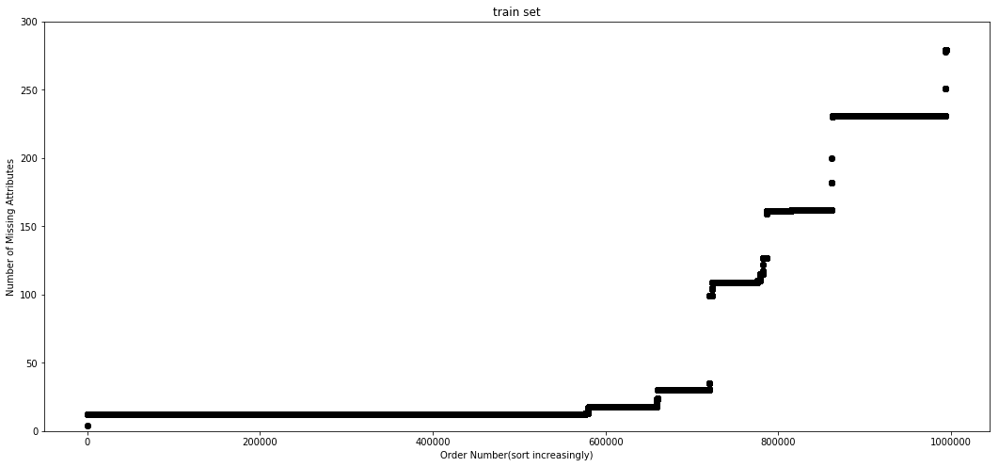

In [72]:
t = data.n_null.values
#y = train.target.values
#y1 = [sum(y[0:i+1]) for i in range(len(y))]
plt.figure(figsize=(18,8))
x = range(len(t))
plt.scatter(x,t,c='k')
#plt.plot(x,y1,c='b')
plt.title('train set')
plt.xlabel('Order Number(sort increasingly)')
plt.ylabel('Number of Missing Attributes')  
plt.ylim(0,300) 
plt.show()

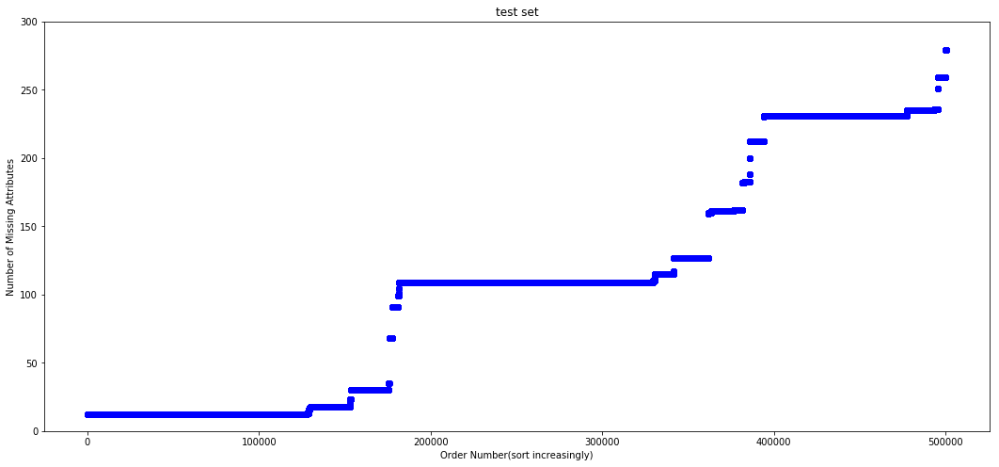

In [74]:
t = data_test.n_null.values
x = range(len(t))
plt.figure(figsize=(18,8))
plt.scatter(x,t,c='b')
plt.title('test set')
plt.ylim(0,300) 
plt.xlabel('Order Number(sort increasingly)')
plt.ylabel('Number of Missing Attributes')
plt.show()

In [78]:
data.describe()

,label,date,f1,f2,f3,f4,f5,f6,f7,f8,f9,f10,f11,f12,f13,f14,f15,f16,f17,f18,f19,f20,f21,f22,f23,f24,f25,f26,f27,f28,f29,f30,f31,f32,f33,f34,f35,f36,f37,f38,f39,f40,f41,f42,f43,f44,f45,f46,f47,f48,f49,f50,f51,f52,f53,f54,f55,f56,f57,f58,f59,f60,f61,f62,f63,f64,f65,f66,f67,f68,f69,f70,f71,f72,f73,f74,f75,f76,f77,f78,f79,f80,f81,f82,f83,f84,f85,f86,f87,f88,f89,f90,f91,f92,f93,f94,f95,f96,f97,f98,f99,f100,f101,f102,f103,f104,f105,f106,f107,f108,f109,f110,f111,f112,f113,f114,f115,f116,f117,f118,f119,f120,f121,f122,f123,f124,f125,f126,f127,f128,f129,f130,f131,f132,f133,f134,f135,f136,f137,f138,f139,f140,f141,f142,f143,f144,f145,f146,f147,f148,f149,f150,f151,f152,f153,f154,f155,f156,f157,f158,f159,f160,f161,f162,f163,f164,f165,f166,f167,f168,f169,f170,f171,f172,f173,f174,f175,f176,f177,f178,f179,f180,f181,f182,f183,f184,f185,f186,f187,f188,f189,f190,f191,f192,f193,f194,f195,f196,f197,f198,f199,f200,f201,f202,f203,f204,f205,f206,f207,f208,f209,f210,f211,f212,f213,f214,f215,f216,f217,f218,f219,f220,f221,f222,f223,f224,f225,f226,f227,f228,f229,f230,f231,f232,f233,f234,f235,f236,f237,f238,f239,f240,f241,f242,f243,f244,f245,f246,f247,f248,f249,f250,f251,f252,f253,f254,f255,f256,f257,f258,f259,f260,f261,f262,f263,f264,f265,f266,f267,f268,f269,f270,f271,f272,f273,f274,f275,f276,f277,f278,f279,f280,f281,f282,f283,f284,f285,f286,f287,f288,f289,f290,f291,f292,f293,f294,f295,f296,f297
count,994731.000000,9.947310e+05,994731.000000,994731.000000,994731.000000,994731.000000,794906.000000,994731.000000,994731.000000,994731.000000,994731.000000,994731.000000,994731.000000,994731.000000,994731.000000,994731.000000,994731.000000,994731.000000,994731.000000,994731.000000,994731.000000,787283.000000,787283.000000,787283.000000,787283.000000,787146.000000,787146.000000,787146.000000,787146.000000,783695.000000,783695.000000,783695.000000,783695.000000,652844.000000,652844.000000,652844.000000,652844.000000,68950.000000,68950.000000,68950.000000,68950.000000,68950.000000,68950.000000,68950.000000,68950.000000,68950.000000,68950.000000,68950.000000,68950.000000,653070.000000,653070.000000,653070.000000,653070.000000,787283.000000,787283.000000,653070.000000,653070.000000,653070.000000,653070.000000,653070.000000,653070.000000,653070.000000,653070.000000,653070.000000,653070.000000,724216.000000,724216.000000,724216.000000,724216.000000,724216.000000,724216.000000,724216.000000,724216.000000,720827.000000,720827.000000,720827.000000,720827.000000,724216.000000,724216.000000,724216.000000,724216.000000,724216.000000,724216.000000,7.242160e+05,7.242160e+05,7.242160e+05,7.242160e+05,7.242160e+05,724216.000000,724216.000000,724216.000000,724216.000000,724216.000000,724216.000000,724216.000000,724216.000000,724216.000000,724216.000000,724216.000000,724216.000000,724216.000000,724216.000000,724216.000000,708446.000000,708446.000000,708446.000000,708446.000000,708446.000000,720827.000000,720827.000000,720827.000000,720827.000000,724216.000000,724216.000000,724216.000000,724216.000000,724216.000000,724216.000000,724216.000000,724216.000000,724216.000000,724216.000000,724216.000000,724216.000000,724216.000000,724216.000000,724216.000000,724216.000000,724216.000000,724216.000000,724216.000000,724216.000000,724216.000000,724216.000000,724216.000000,724216.000000,724216.000000,724216.000000,724216.000000,724216.000000,724216.000000,724216.000000,724216.000000,724216.000000,724216.000000,724216.000000,724216.000000,724216.000000,724216.000000,724216.000000,724216.000000,724216.000000,724216.000000,724216.000000,724216.000000,724216.000000,720827.000000,720827.00000,720827.000000,720827.000000,720827.000000,720827.000000,993812.000000,993812.000000,993812.000000,993812.000000,993812.000000,858710.000000,858710.000000,858710.000000,858710.000000,858710.000000,858710.000000,858710.000000,858710.000000,858710.000000,858710.000000,858710.000000,858710.000000,858710.000000,858710.000000,858710.000000,858710.000000,858710.000000,858710.000000,858710.000000,858710.000000,858710